## **Installing Dependencies and Cloning Repositories**

In [1]:
!git clone https://github.com/kohya-ss/sd-scripts.git
%cd sd-scripts

!pip install -r requirements.txt
!pip install xformers bitsandbytes wandb huggingface_hub

Cloning into 'sd-scripts'...
remote: Enumerating objects: 11015, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (110/110), done.
remote: Total 11015 (delta 83), reused 51 (delta 37), pack-reused 10868 (from 2)
Receiving objects: 100% (11015/11015), 17.94 MiB | 22.43 MiB/s, done.
Resolving deltas: 100% (7835/7835), done.
/kaggle/working/sd-scripts
Obtaining file:///kaggle/working/sd-scripts (from -r requirements.txt (line 49))
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 1.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.0/71.0 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.7/354.7 kB 13.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.2/11.2 MB 99.2 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━

## **Configuration and Authentication**

In [2]:
import os
from accelerate.utils import write_basic_config

write_basic_config(mixed_precision="fp16")
os.environ["ACCELERATE_CONFIG_FILE"] = "/root/.cache/huggingface/accelerate/default_config.yaml"
print("Accelerate config created!")

Accelerate config created!


In [3]:
from huggingface_hub import snapshot_download
import wandb

try:
    from kaggle_secrets import UserSecretsClient
    user_secrets = UserSecretsClient()
    HF_TOKEN = user_secrets.get_secret("HF_TOKEN")
    print("Successfully loaded HF_TOKEN from Kaggle Secrets.")
except ImportError:
    HF_TOKEN = os.getenv("HF_TOKEN")
    print("Kaggle Secrets not found. Using environment variable.")

os.environ["HF_TOKEN"] = HF_TOKEN

try:
    user_secrets = UserSecretsClient()
    WANDB_KEY = user_secrets.get_secret("WANDB_API_KEY")
    wandb.login(key=WANDB_KEY)
    print("Successfully logged into W&B!")
except ImportError:
    wandb.login()

Successfully loaded HF_TOKEN from Kaggle Secrets.


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: [wandb.login()] Using explicit session credentials for https://api.wandb.ai.
wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: anyknysh2000 (anyknysh2000-) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Successfully logged into W&B!


In [ ]:
dataset_dir = "/kaggle/working/cossacks_dataset/1_kzk" 

snapshot_download(
    repo_id="hannusia123123/cossacks-lora",
    repo_type="dataset",
    local_dir=dataset_dir,
    token=HF_TOKEN
)

prompts = """
kzk style, a strong man with a long black mustache wearing wide red pants (sharovary) and a white shirt, standing in a field, bright sunny day --w 1024 --h 1024 --d 42
kzk style, a wide shot of a green steppe with a winding river and a small windmill on a hill, fluffy white clouds in the blue sky --w 1024 --h 1024 --d 123
kzk style, a close up of a large clay jug and a wooden bowl full of dumplings on a wooden table --w 1024 --h 1024 --d 777
"""
with open("/kaggle/working/sample_prompts.txt", "w") as f:
    f.write(prompts.strip())

In [8]:
!rm -rf /kaggle/working/cossacks_dataset/1_kzk/.cache
!rm -f /kaggle/working/cossacks_dataset/1_kzk/.gitattributes

!ls /kaggle/working/cossacks_dataset/1_kzk

cossack_001.jpg  cossack_012.jpg  cossack_026.jpg  cossack_038.jpg
cossack_001.txt  cossack_012.txt  cossack_026.txt  cossack_038.txt
cossack_002.jpg  cossack_014.jpg  cossack_027.jpg  cossack_039.jpg
cossack_002.txt  cossack_014.txt  cossack_027.txt  cossack_039.txt
cossack_003.jpg  cossack_015.jpg  cossack_028.jpg  cossack_040.jpg
cossack_003.txt  cossack_015.txt  cossack_028.txt  cossack_040.txt
cossack_004.jpg  cossack_016.jpg  cossack_029.jpg  cossack_041.jpg
cossack_004.txt  cossack_016.txt  cossack_029.txt  cossack_041.txt
cossack_005.jpg  cossack_017.jpg  cossack_030.jpg  cossack_042.jpg
cossack_005.txt  cossack_017.txt  cossack_030.txt  cossack_042.txt
cossack_006.jpg  cossack_019.jpg  cossack_031.jpg  cossack_043.jpg
cossack_006.txt  cossack_019.txt  cossack_031.txt  cossack_043.txt
cossack_007.jpg  cossack_021.jpg  cossack_032.jpg  cossack_044.jpg
cossack_007.txt  cossack_021.txt  cossack_032.txt  cossack_044.txt
cossack_008.jpg  cossack_022.jpg  cossack_033.jpg  cossack_045

## **Training**

In [9]:
%%bash
cd /kaggle/working/sd-scripts
accelerate launch --num_cpu_threads_per_process=2 sdxl_train_network.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --network_module="networks.lora" \
  --train_data_dir="/kaggle/working/cossacks_dataset" \
  --caption_extension=".txt" \
  --output_dir="/kaggle/working/output_exp2" \
  --output_name="cossacks_exp2" \
  --resolution="1024,1024" \
  --train_batch_size=1 \
  --gradient_accumulation_steps=8 \
  --max_train_epochs=50 \
  --network_dim=32 \
  --network_alpha=32 \
  --optimizer_type="Prodigy" \
  --learning_rate=1.0 \
  --unet_lr=1.0 \
  --text_encoder_lr=1.0 \
  --optimizer_args "weight_decay=0.01" "decouple=True" "use_bias_correction=True" "d_coef=2" \
  --lr_scheduler="cosine" \
  --mixed_precision="fp16" \
  --save_precision="fp16" \
  --no_half_vae \
  --save_every_n_epochs=5 \
  --xformers \
  --gradient_checkpointing \
  --sample_prompts="/kaggle/working/sample_prompts.txt" \
  --sample_sampler="euler_a" \
  --sample_every_n_epochs=5 \
  --logging_dir="/kaggle/working/logs" \
  --log_with="wandb" \
  --log_tracker_name="cossacks_lora_experiments" \
  --huggingface_repo_id="hannusia123123/cossacks-models" \
  --huggingface_path_in_repo="experiment_2" \
  --huggingface_token=$HF_TOKEN \
  --async_upload \
  --seed=42

accelerator device: cuda:0
accelerator device: cuda:1
import network module: networks.lora
Using decoupled weight decay
prepare optimizer, data loader etc.
Using decoupled weight decay
override steps. steps for 50 epochs is / 指定エポックまでのステップ数: 150
running training / 学習開始
  num train images * repeats / 学習画像の数×繰り返し回数: 43
  num validation images * repeats / 学習画像の数×繰り返し回数: 0
  num reg images / 正則化画像の数: 0
  num batches per epoch / 1epochのバッチ数: 22
  num epochs / epoch数: 50
  batch size per device / バッチサイズ: 1
  gradient accumulation steps / 勾配を合計するステップ数 = 8
  total optimization steps / 学習ステップ数: 150

epoch 1/50


epoch 2/50


epoch 3/50


epoch 4/50


epoch 5/50


saving checkpoint: /kaggle/working/output_exp2/cossacks_exp2-000005.safetensors

epoch 6/50


epoch 7/50


epoch 8/50


epoch 9/50


epoch 10/50


saving checkpoint: /kaggle/working/output_exp2/cossacks_exp2-000010.safetensors

epoch 11/50


epoch 12/50


epoch 13/50


epoch 14/50


epoch 15/50


saving checkpoint: /kaggle/working/outp

2026-03-29 18:10:15.712528: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2026-03-29 18:10:15.712532: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774807815.737082    2470 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774807815.737124    2471 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774807815.744913    2470 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
E0000 00:00:1774807815.744919    2471 cuda_blas.cc:1

## **Visualizing the evolution of style during the learning process**

Found 30 generated images. Building the evolution grid...


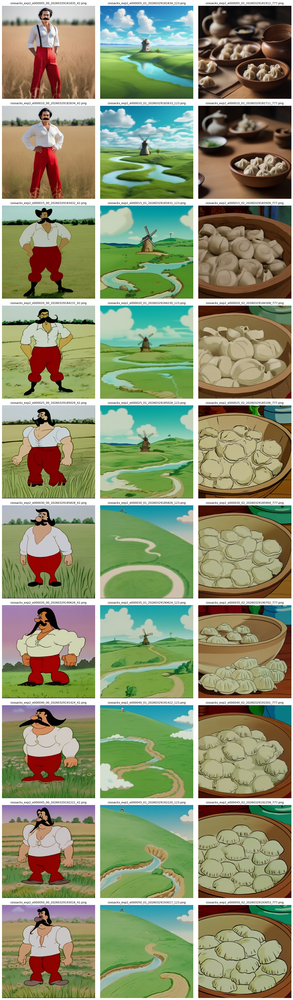

In [12]:
import math
import matplotlib.pyplot as plt
from PIL import Image

sample_dir = "/kaggle/working/output_exp2/sample"

if os.path.exists(sample_dir):
    images = [f for f in os.listdir(sample_dir) if f.endswith(('.png', '.jpg'))]
    images.sort() 
    
    if images:
        print(f"Found {len(images)} generated images. Building the evolution grid...")
        
        cols = 3 
        rows = math.ceil(len(images) / cols)
        
        fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
        
        if rows > 1:
            axes = axes.flatten()
        else:
            axes = [axes] if cols == 1 else axes
        
        for i, img_name in enumerate(images):
            img_path = os.path.join(sample_dir, img_name)
            img = Image.open(img_path)
            
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(img_name, fontsize=10)
            
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')
            
        plt.tight_layout()
        plt.show()
    else:
        print("The 'sample' folder is empty. The images have not been generated yet.")
else:
    print(f"The {sample_dir} folder was not found.")

## **Choosing the best model**

2026-03-29 19:59:04.179369: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1774814344.318120      55 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1774814344.362478      55 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1774814344.723926      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774814344.723956      55 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1774814344.723959      55 computation_placer.cc:177] computation placer alr

Loading the base SDXL pipeline...


Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]


Evaluating checkpoint: Epoch 20


Token indices sequence length is longer than the specified maximum sequence length for this model (88 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']


  Generating image for prompt 1...


Token indices sequence length is longer than the specified maximum sequence length for this model (88 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']


  0%|          | 0/30 [00:00<?, ?it/s]

  Generating image for prompt 2...


  0%|          | 0/30 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']


  Generating image for prompt 3...


  0%|          | 0/30 [00:00<?, ?it/s]


Evaluating checkpoint: Epoch 30


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']


  Generating image for prompt 1...


  0%|          | 0/30 [00:00<?, ?it/s]

  Generating image for prompt 2...


  0%|          | 0/30 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']


  Generating image for prompt 3...


  0%|          | 0/30 [00:00<?, ?it/s]


Evaluating checkpoint: Epoch 35


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']


  Generating image for prompt 1...


  0%|          | 0/30 [00:00<?, ?it/s]

  Generating image for prompt 2...


  0%|          | 0/30 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']


  Generating image for prompt 3...


  0%|          | 0/30 [00:00<?, ?it/s]


Evaluating checkpoint: Epoch 45


The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['silhouettes of sleeping horses. expressive character, detailed pose']


  Generating image for prompt 1...


  0%|          | 0/30 [00:00<?, ?it/s]

  Generating image for prompt 2...


  0%|          | 0/30 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['detailed textures, appetizing food']


  Generating image for prompt 3...


  0%|          | 0/30 [00:00<?, ?it/s]


Evaluation complete. Displaying results...


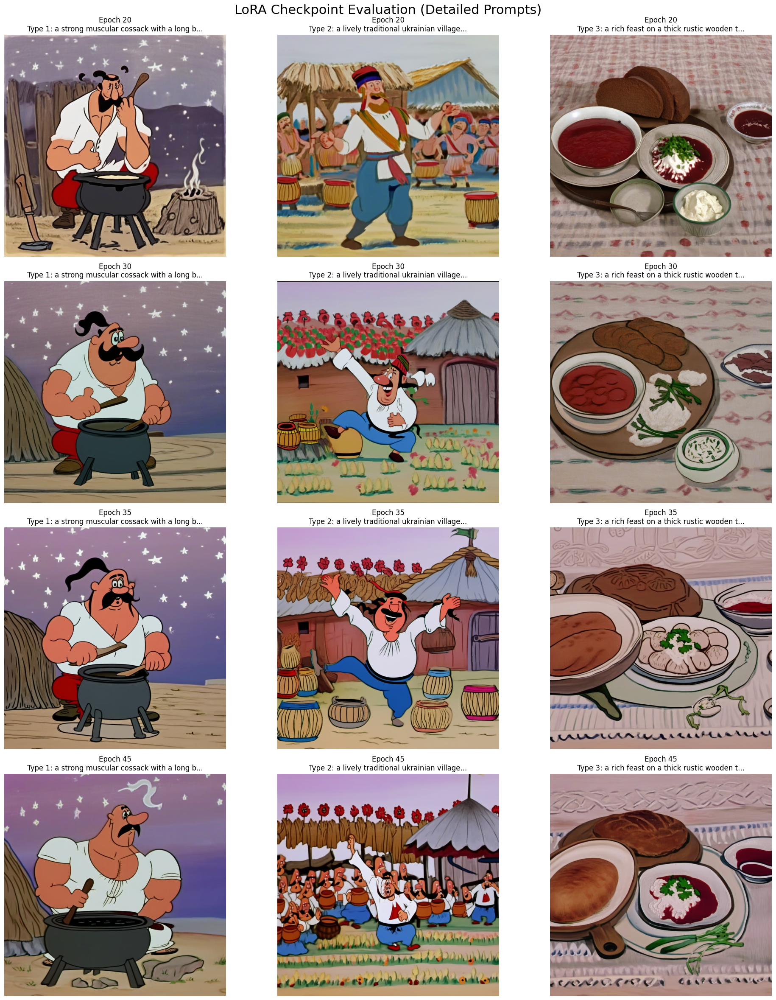

In [13]:
import torch
from diffusers import StableDiffusionXLPipeline
import matplotlib.pyplot as plt
import gc

print("Loading the base SDXL pipeline...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
).to("cuda")

checkpoints = {
    "Epoch 20": "/kaggle/working/output_exp2/cossacks_exp2-000020.safetensors",
    "Epoch 30": "/kaggle/working/output_exp2/cossacks_exp2-000030.safetensors",
    "Epoch 35": "/kaggle/working/output_exp2/cossacks_exp2-000035.safetensors",
    "Epoch 45": "/kaggle/working/output_exp2/cossacks_exp2-000045.safetensors"
}

test_prompts = [
    "kzk style, a strong muscular cossack with a long black mustache and a forelock, wearing an unbuttoned white shirt and wide red pants, sitting on a wooden log near a bright campfire. He is carefully stirring a thick porridge in a large black cast-iron cauldron with a long wooden spoon. In the background, a dark starry night sky and faint silhouettes of sleeping horses. expressive character, detailed pose",
    "kzk style, a lively traditional ukrainian village fair on a sunny summer day. Wooden stalls filled with colorful clay jugs and woven baskets. In the center, a joyful cossack is dancing enthusiastically. A white whitewashed hut with a thatched roof and a woven wooden fence decorated with blooming sunflowers in the background. vibrant colors, dynamic composition, lively atmosphere",
    "kzk style, a rich feast on a thick rustic wooden table covered with a traditional white embroidered tablecloth. A large handmade clay bowl filled with steaming red borsch and a thick dollop of white sour cream. Next to it, a wooden plate piled high with plump dumplings, a sliced loaf of dark rye bread, and fresh green onions. cozy warm lighting, detailed textures, appetizing food"
]

fig, axes = plt.subplots(len(checkpoints), len(test_prompts), figsize=(20, 6 * len(checkpoints)))
fig.suptitle("LoRA Checkpoint Evaluation (Detailed Prompts)", fontsize=22)

for i, (ckpt_name, ckpt_path) in enumerate(checkpoints.items()):
    print(f"\nEvaluating checkpoint: {ckpt_name}")
    
    pipe.load_lora_weights(ckpt_path)
    
    for j, prompt in enumerate(test_prompts):
        print(f"  Generating image for prompt {j+1}...")
        
        image = pipe(
            prompt, 
            num_inference_steps=30, 
            guidance_scale=7.5, 
            cross_attention_kwargs={"scale": 1.0},
            generator=torch.Generator("cuda").manual_seed(9999) 
        ).images[0]
        
        ax = axes[i, j]
        ax.imshow(image)
        short_title = f"{ckpt_name}\nType {j+1}: {prompt.split(',')[1][:40].strip()}..."
        ax.set_title(short_title, fontsize=12)
        ax.axis('off')
        
    pipe.unload_lora_weights()
    gc.collect()
    torch.cuda.empty_cache()

plt.tight_layout()
plt.subplots_adjust(top=0.95)
print("\nEvaluation complete. Displaying results...")
plt.show()